In [ ]:
from google.colab import files  # Import the "files" module from the "google.colab" library

files.upload()  # Choose the kaggle.json file for your device


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"rahafosama","key":"c01c5bd5c9c7f141d7674b96edb3eb84"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

ref                                                                    title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
bhadramohit/customer-shopping-latest-trends-dataset                    Customer Shopping (Latest Trends) Dataset            76KB  2024-11-23 15:26:12          15185        294  1.0              
hopesb/student-depression-dataset                                      Student Depression Dataset.                         454KB  2024-11-22 17:56:03          11985        153  1.0              
rashminslnk/youtube-subscribers-data-2024                              Youtube Subscribers Data 2024                         1KB  2024-12-06 12:10:46           1737         36  1.0              
chadwambles/supermarket-s

In [ ]:
!kaggle datasets download -d puneet6060/intel-image-classification

Dataset URL: https://www.kaggle.com/datasets/puneet6060/intel-image-classification
License(s): copyright-authors
100% 346M/346M [00:13<00:00, 24.1MB/s]
100% 346M/346M [00:13<00:00, 26.1MB/s]


In [ ]:
import zipfile
with zipfile.ZipFile("intel-image-classification.zip", 'r') as zip_ref:
    zip_ref.extractall("intel-image-classification")

In [ ]:
import os
os.listdir("intel-image-classification")

['seg_pred', 'seg_train', 'seg_test']

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
from tensorflow import keras
from tensorflow.keras import layers, regularizers

In [ ]:
trainpath = 'intel-image-classification/seg_train/'

for folder in  os.listdir(trainpath + 'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2512 in folder mountain
For training data , found 2382 in folder street
For training data , found 2271 in folder forest
For training data , found 2404 in folder glacier
For training data , found 2274 in folder sea
For training data , found 2191 in folder buildings


In [ ]:
testpath = 'intel-image-classification/seg_test/'

for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 525 in folder mountain
For testing data , found 501 in folder street
For testing data , found 474 in folder forest
For testing data , found 553 in folder glacier
For testing data , found 510 in folder sea
For testing data , found 437 in folder buildings


In [ ]:
predpath = 'intel-image-classification/seg_pred/'

files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


_____

# Checking Images
now we need to heck the images sizes , to know ow they looks like



since we have 6 categories , we first need to create a dictionary with their names & indices , also create a function to get the code back

In [ ]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) :
    for x , y in code.items() :
        if n == y :
            return x

In [ ]:
size = []
for folder in  os.listdir(trainpath +'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(150, 150, 3)",13986
"(113, 150, 3)",7
"(111, 150, 3)",3
"(135, 150, 3)",3
"(142, 150, 3)",2
"(108, 150, 3)",2
"(144, 150, 3)",2
"(143, 150, 3)",2
"(134, 150, 3)",2
"(146, 150, 3)",2


In [ ]:
size = []
for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(150, 150, 3)",2993
"(81, 150, 3)",1
"(131, 150, 3)",1
"(141, 150, 3)",1
"(149, 150, 3)",1
"(110, 150, 3)",1
"(76, 150, 3)",1
"(72, 150, 3)",1


In [ ]:
size = []
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
for file in files:
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

,count
"(150, 150, 3)",7288
"(129, 150, 3)",1
"(374, 500, 3)",1
"(124, 150, 3)",1
"(108, 150, 3)",1
"(131, 150, 3)",1
"(139, 150, 3)",1
"(112, 150, 3)",1
"(126, 150, 3)",1
"(143, 150, 3)",1


# Reading Images

now it's time to read all images & convert it into arrays

first we'll create a variable s , which refer to size , so we can change it easily

let's use now size = 100 , so it will be suitable amount to contain accuracy without losing so much time in training

In [ ]:
s = 100
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])
        print(f'we have {len(X_train)} items in X_train')

Streaming output truncated to the last 5000 lines.
we have 9035 items in X_train
we have 9036 items in X_train
we have 9037 items in X_train
we have 9038 items in X_train
we have 9039 items in X_train
we have 9040 items in X_train
we have 9041 items in X_train
we have 9042 items in X_train
we have 9043 items in X_train
we have 9044 items in X_train
we have 9045 items in X_train
we have 9046 items in X_train
we have 9047 items in X_train
we have 9048 items in X_train
we have 9049 items in X_train
we have 9050 items in X_train
we have 9051 items in X_train
we have 9052 items in X_train
we have 9053 items in X_train
we have 9054 items in X_train
we have 9055 items in X_train
we have 9056 items in X_train
we have 9057 items in X_train
we have 9058 items in X_train
we have 9059 items in X_train
we have 9060 items in X_train
we have 9061 items in X_train
we have 9062 items in X_train
we have 9063 items in X_train
we have 9064 items in X_train
we have 9065 items in X_train
we have 9066 items 

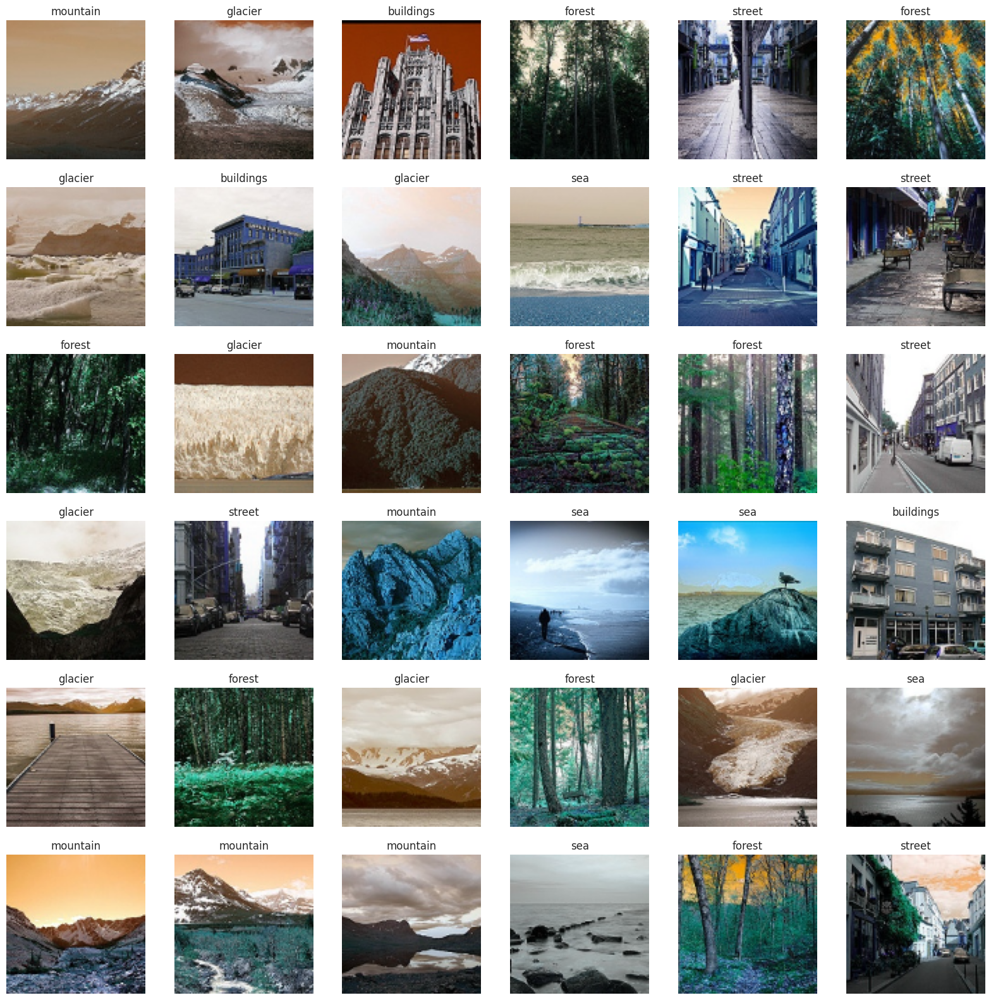

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [ ]:
s = 100
X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])
        print(f'we have {len(X_test)} items in X_test')

we have 1 items in X_test
we have 2 items in X_test
we have 3 items in X_test
we have 4 items in X_test
we have 5 items in X_test
we have 6 items in X_test
we have 7 items in X_test
we have 8 items in X_test
we have 9 items in X_test
we have 10 items in X_test
we have 11 items in X_test
we have 12 items in X_test
we have 13 items in X_test
we have 14 items in X_test
we have 15 items in X_test
we have 16 items in X_test
we have 17 items in X_test
we have 18 items in X_test
we have 19 items in X_test
we have 20 items in X_test
we have 21 items in X_test
we have 22 items in X_test
we have 23 items in X_test
we have 24 items in X_test
we have 25 items in X_test
we have 26 items in X_test
we have 27 items in X_test
we have 28 items in X_test
we have 29 items in X_test
we have 30 items in X_test
we have 31 items in X_test
we have 32 items in X_test
we have 33 items in X_test
we have 34 items in X_test
we have 35 items in X_test
we have 36 items in X_test
we have 37 items in X_test
we have 38

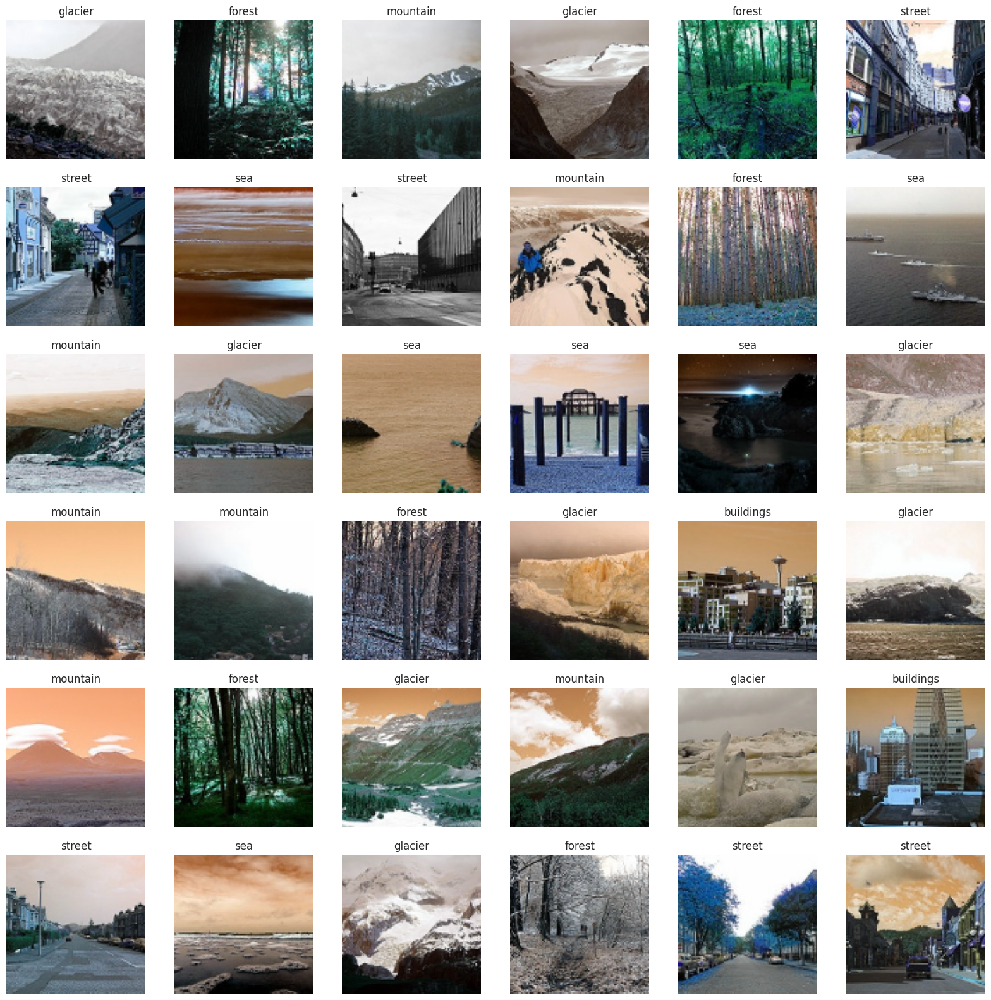

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [ ]:
s = 100
X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files:
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))
    print(f'we have {len(X_pred)} items in X_pred')

Streaming output truncated to the last 5000 lines.
we have 2302 items in X_pred
we have 2303 items in X_pred
we have 2304 items in X_pred
we have 2305 items in X_pred
we have 2306 items in X_pred
we have 2307 items in X_pred
we have 2308 items in X_pred
we have 2309 items in X_pred
we have 2310 items in X_pred
we have 2311 items in X_pred
we have 2312 items in X_pred
we have 2313 items in X_pred
we have 2314 items in X_pred
we have 2315 items in X_pred
we have 2316 items in X_pred
we have 2317 items in X_pred
we have 2318 items in X_pred
we have 2319 items in X_pred
we have 2320 items in X_pred
we have 2321 items in X_pred
we have 2322 items in X_pred
we have 2323 items in X_pred
we have 2324 items in X_pred
we have 2325 items in X_pred
we have 2326 items in X_pred
we have 2327 items in X_pred
we have 2328 items in X_pred
we have 2329 items in X_pred
we have 2330 items in X_pred
we have 2331 items in X_pred
we have 2332 items in X_pred
we have 2333 items in X_pred
we have 2334 items in

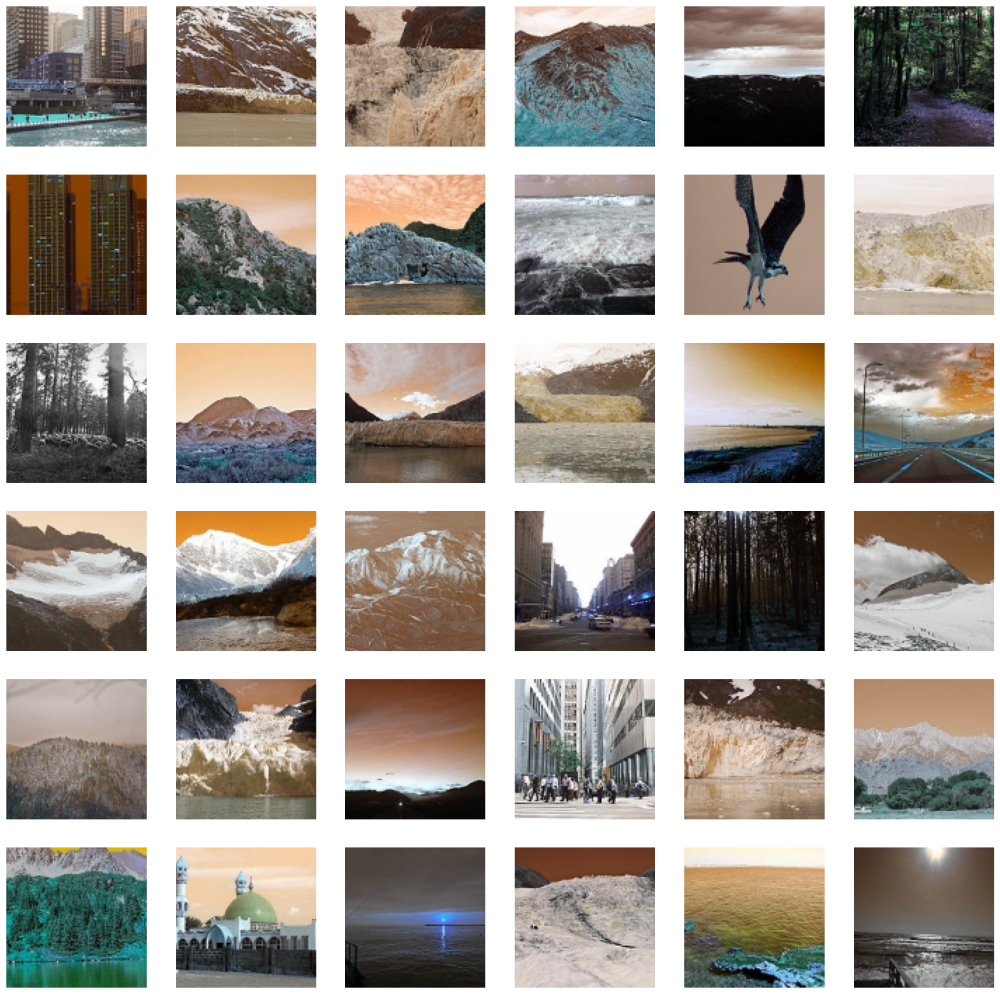

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')


________

# **Building The Model**

now we need to build the model to train our data

first to convert the data into arrays using numpy


# Keras

In [ ]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
print(f'X_train shape is {X_train.shape}')
print(f'X_val shape is {X_val.shape}')
print(f'X_test shape is {X_test.shape}')
print(f'y_train shape is {y_train.shape}')
print(f'y_val shape is {y_val.shape}')
print(f'y_test shape is {y_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')

X_train shape is (14034, 100, 100, 3)


NameError: name 'X_val' is not defined

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [ ]:
KerasModel = keras.models.Sequential([
    layers.Conv2D(128, kernel_size=(3,3), activation='relu', input_shape=(s,s,3)),
    layers.Conv2D(128, kernel_size=(3,3), activation='relu'),
    layers.MaxPool2D(pool_size=(2,2)),
    layers.Dropout(0.3),

    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.MaxPool2D(pool_size=(2,2)),
    layers.Dropout(0.3),

    layers.Conv2D(32, kernel_size=(3,3), activation='relu'),
    layers.MaxPool2D(pool_size=(2,2)),
    layers.Dropout(0.3),

    layers.Flatten(),

    layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.Dropout(0.5),
    layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.Dropout(0.5),
    layers.Dense(6, activation='softmax')
])
# Compile the model
KerasModel.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [ ]:
print('Model Details are : ')
print(KerasModel.summary())

In [ ]:
history = KerasModel.fit(
    X_train,
    y_train,
    epochs=100,
    validation_data=(X_val, y_val),
    #callbacks=[early_stopping]
)

In [ ]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

# Results

Convution Matrix

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, predicted_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

F - Measure

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, predicted_classes, target_names=class_names))
# class_names is a list of your class labels